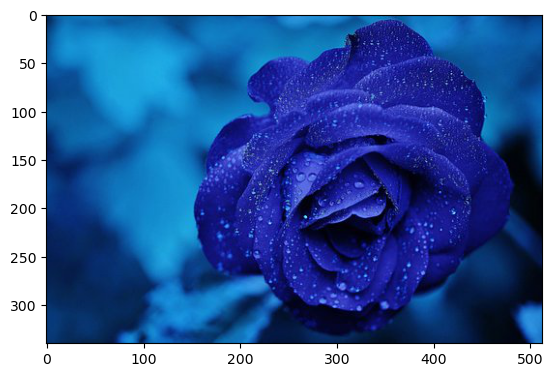

(<matplotlib.image.AxesImage at 0x227354824f0>, None)

In [1]:
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np
import numpy.fft
import timeit
im=Image.open('Pictures/rose.jpg')
pylab.imshow(im), pylab.show()

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\2475157906.py:1: DeprecationWarning: NEAREST is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  im1=im.resize((im.width*5,im.height*5), Image.NEAREST)


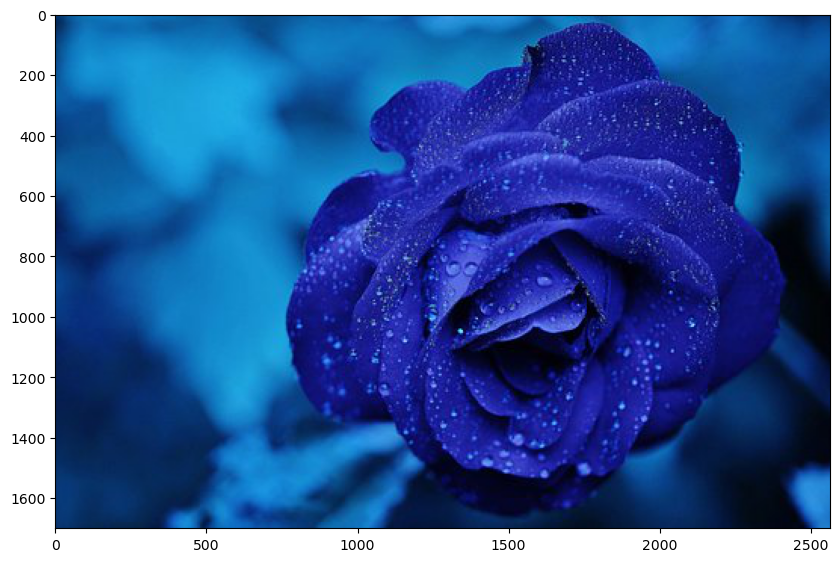

In [2]:
im1=im.resize((im.width*5,im.height*5), Image.NEAREST)
pylab.figure(figsize=(10,10)),
pylab.imshow(im1),
pylab.show()

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\2532965859.py:1: DeprecationWarning: BILINEAR is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BILINEAR instead.
  im1=im.resize((im.width*5,im.height*5), Image.BILINEAR)


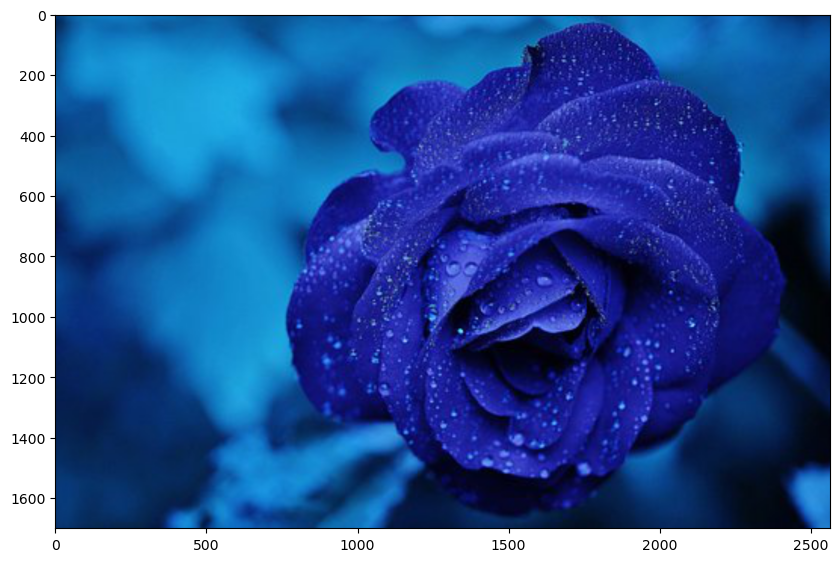

In [3]:
im1=im.resize((im.width*5,im.height*5), Image.BILINEAR)
pylab.figure(figsize=(10,10)),
pylab.imshow(im1),
pylab.show()

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\1525215097.py:1: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  im1=im.resize((im.width*5,im.height*5), Image.BICUBIC)


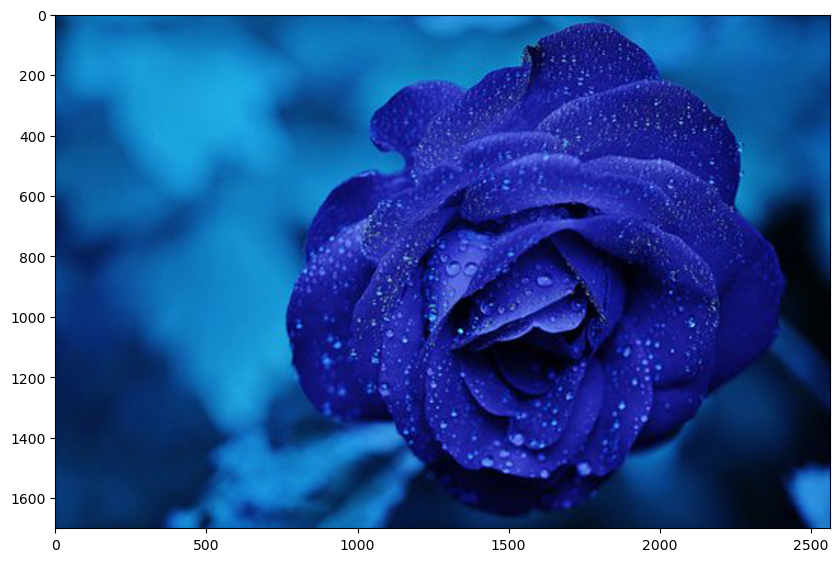

In [4]:
im1=im.resize((im.width*5,im.height*5), Image.BICUBIC)
pylab.figure(figsize=(10,10)),
pylab.imshow(im1),
pylab.show()


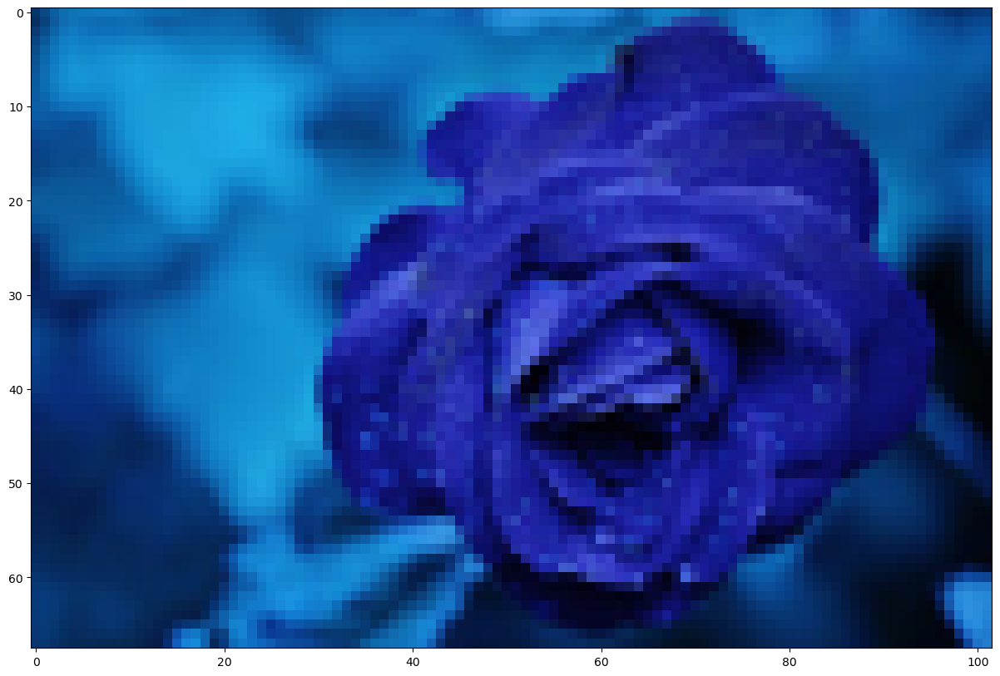

(<Figure size 1500x1000 with 1 Axes>,
 None)

In [6]:
im=Image.open('Pictures/rose.jpg')
im=im.resize((im.width//5,im.height//5))
pylab.figure(figsize=(15,10)),pylab.imshow(im),pylab.show()

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\2095234729.py:1: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  im=im.resize((im.width//5,im.height//5), Image.ANTIALIAS)


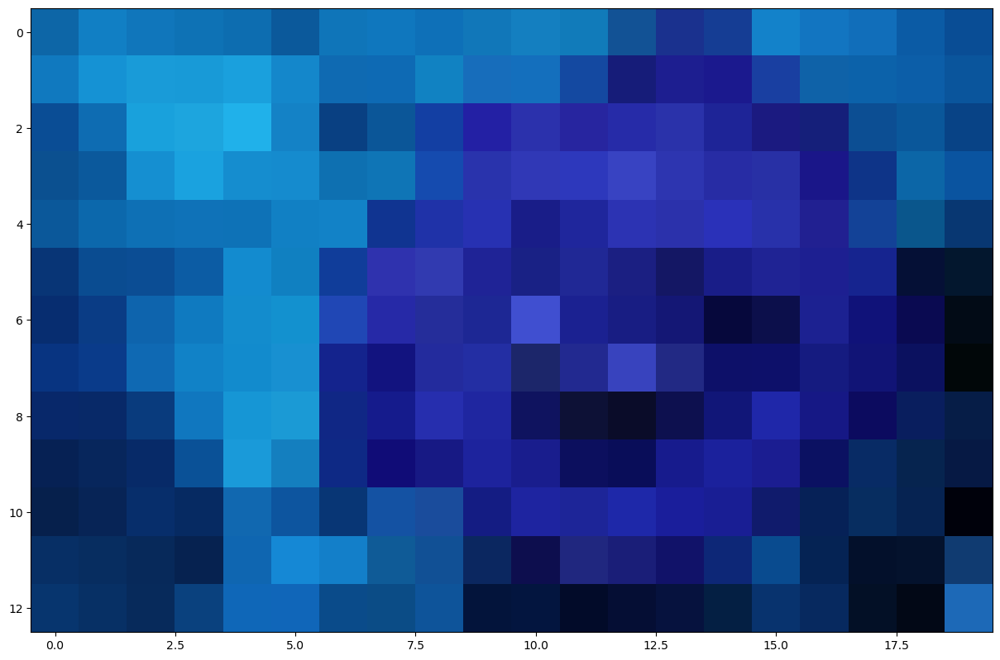

(<Figure size 1500x1000 with 1 Axes>,
 None)

In [7]:
im=im.resize((im.width//5,im.height//5), Image.ANTIALIAS)
pylab.figure(figsize=(15,10)),pylab.imshow(im),pylab.show()

In [9]:
im=imread('Pictures/rose.jpg')
im1=im.copy()
pylab.figure(figsize=(20,15))
for i in range(4):
pylab.subplot(2,2,i+1), pylab.imshow(im1,cmap='gray'),pylab.axis('off')
pylab.title('Image size= '+str(im1.shape[1])+'x'+str(im1.shape[0]))
im1=rescale(im1,scale=0.5,multichannel=True, anti_aliasing=False)
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

IndentationError: expected an indented block (1816332385.py, line 5)

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\301041517.py:7: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im1=rescale(im1,scale=0.5,multichannel=True, anti_aliasing=False)


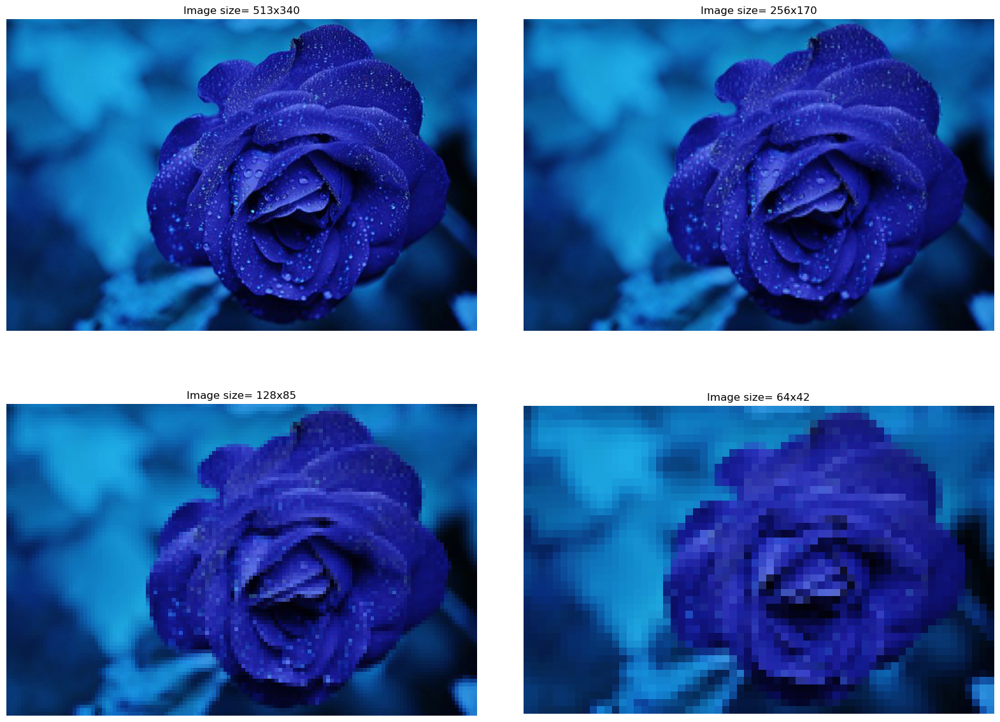

In [10]:
im=imread('Pictures/rose.jpg')
im1=im.copy()
pylab.figure(figsize=(20,15))
for i in range(4):
    pylab.subplot(2,2,i+1), pylab.imshow(im1,cmap='gray'),pylab.axis('off')
    pylab.title('Image size= '+str(im1.shape[1])+'x'+str(im1.shape[0]))
    im1=rescale(im1,scale=0.5,multichannel=True, anti_aliasing=False)
    pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\3950385908.py:7: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im1=rescale(im1,scale=0.5,multichannel=True, anti_aliasing=True)


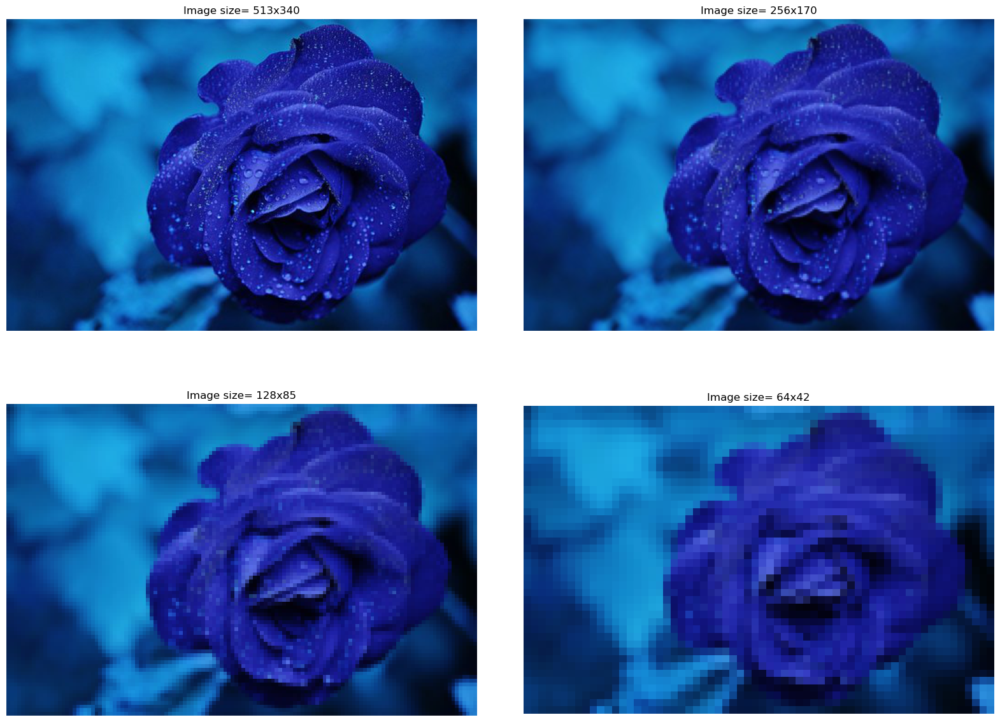

In [12]:
im=imread('Pictures/rose.jpg')
im1=im.copy()
pylab.figure(figsize=(20,15))
for i in range(4):
     pylab.subplot(2,2,i+1), pylab.imshow(im1,cmap='gray'),pylab.axis('off')
     pylab.title('Image size= '+str(im1.shape[1])+'x'+str(im1.shape[0]))
     im1=rescale(im1,scale=0.5,multichannel=True, anti_aliasing=True)
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\671585149.py:12: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  im1=im.convert('P',palette=Image.ADAPTIVE, colors=num_colors)


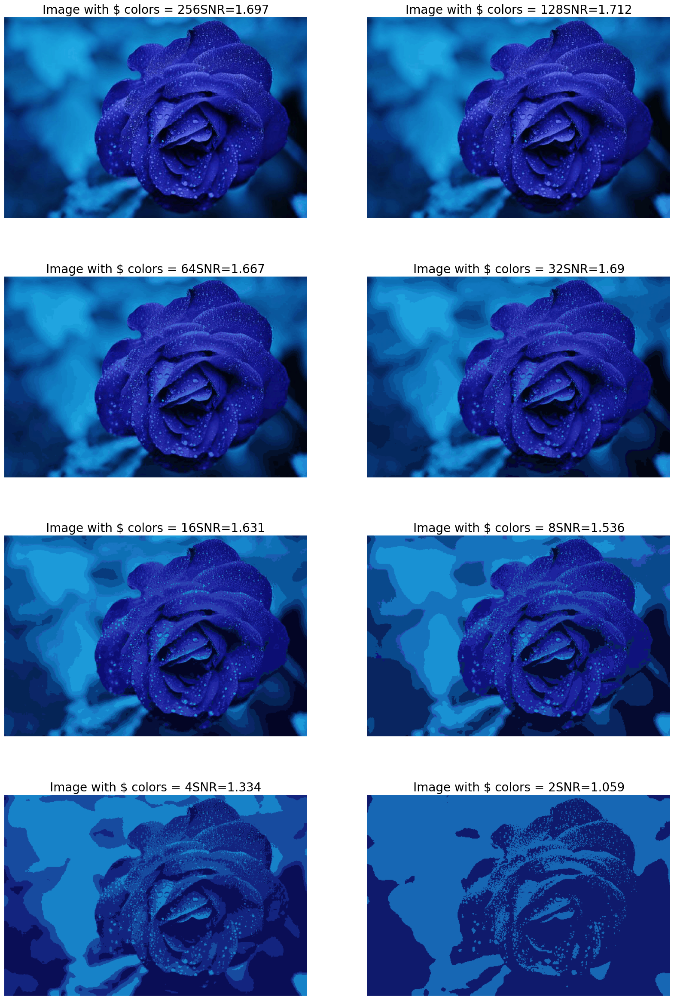

In [15]:
im=Image.open('Pictures/rose.jpg')
def signaltonoise(a,axis=0,ddof=0):
    a=np.asanyarray(a)
    n=a.mean(axis)
    sd=a.std(axis=axis,ddof=ddof)
    return np.where (sd==0, 0, n/sd)
pylab.figure(figsize=(20,30))
num_colors_list=[1<<n for n in range (8,0,-1)]
snr_list=[]
i=1
for num_colors in num_colors_list:
    im1=im.convert('P',palette=Image.ADAPTIVE, colors=num_colors)
    pylab.subplot(4,2,i),pylab.imshow(im1), pylab.axis('off')
    snr_list.append(signaltonoise(im1,axis=None))
    pylab.title('Image with $ colors = '+str(num_colors)+ 'SNR=' + str(np.round(snr_list[i-
1],3)),size=20)
    i+=1
pylab.subplots_adjust(wspace=0.2, hspace=0.2)
pylab.show()

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\3500478960.py:7: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im1=rescale(im1,scale=0.5,multichannel=True, anti_aliasing=True)


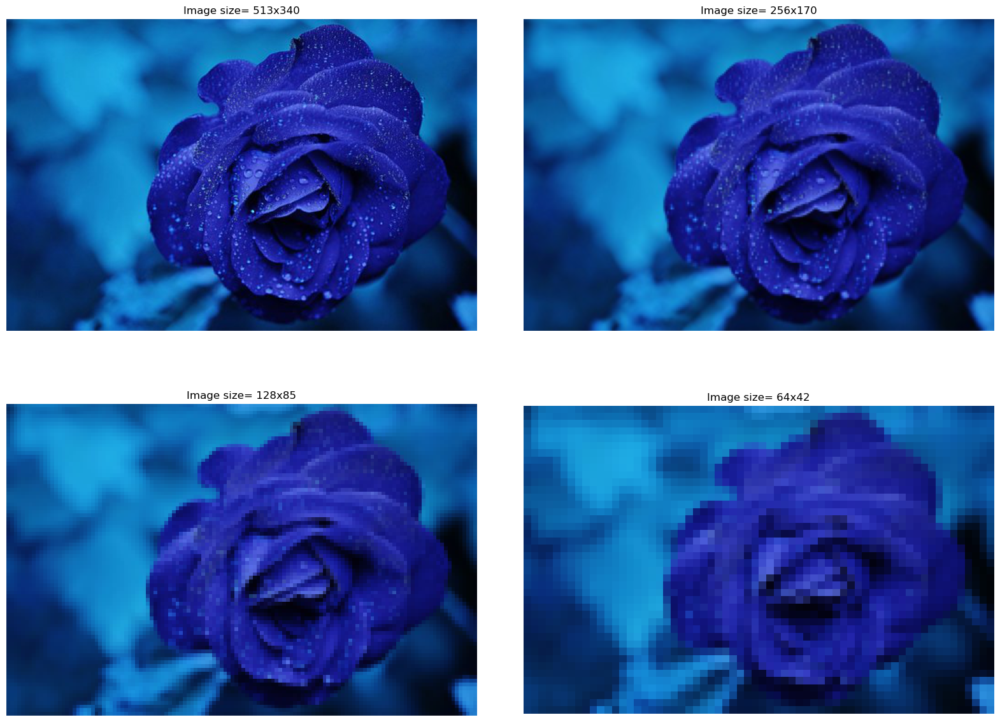

In [17]:
im=imread('Pictures/rose.jpg')
im1=im.copy()
pylab.figure(figsize=(20,15))
for i in range(4):
   pylab.subplot(2,2,i+1), pylab.imshow(im1,cmap='gray'),pylab.axis('off')
   pylab.title('Image size= '+str(im1.shape[1])+'x'+str(im1.shape[0]))
   im1=rescale(im1,scale=0.5,multichannel=True, anti_aliasing=True)
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\2084880254.py:12: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  im1=im.convert('P',palette=Image.ADAPTIVE, colors=num_colors)


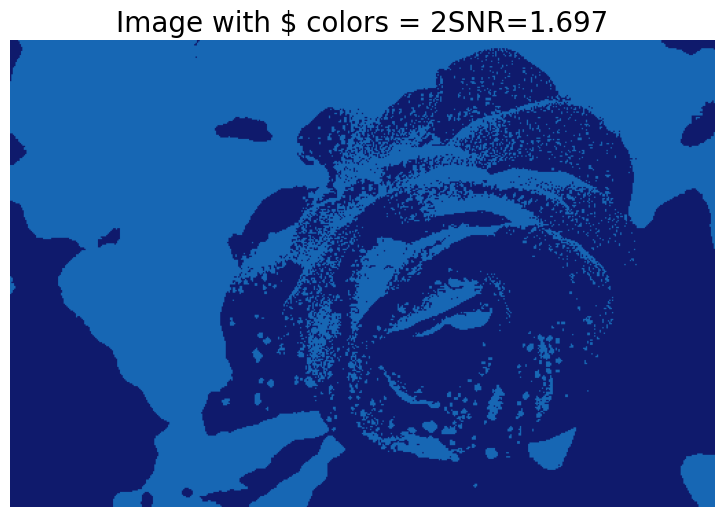

In [29]:
im=Image.open('Pictures/rose.jpg')
def signaltonoise(a,axis=0,ddof=0):
  a=np.asanyarray(a)
  n=a.mean(axis)
  sd=a.std(axis=axis,ddof=ddof)
  return np.where (sd==0, 0, n/sd)
pylab.figure(figsize=(20,30))
num_colors_list=[1<<n for n in range (8,0,-1)]
snr_list=[]
i=1
for num_colors in num_colors_list:
  im1=im.convert('P',palette=Image.ADAPTIVE, colors=num_colors)
  pylab.subplot(4,2,i),pylab.imshow(im1), pylab.axis('off')
  snr_list.append(signaltonoise(im1,axis=None))
  pylab.title('Image with $ colors = '+str(num_colors)+ 'SNR=' + str(np.round(snr_list[i-
1],3)),size=20)
i+=1
pylab.subplots_adjust(wspace=0.2, hspace=0.2)
pylab.show()

TypeError: __init__() got an unexpected keyword argument 'basex'

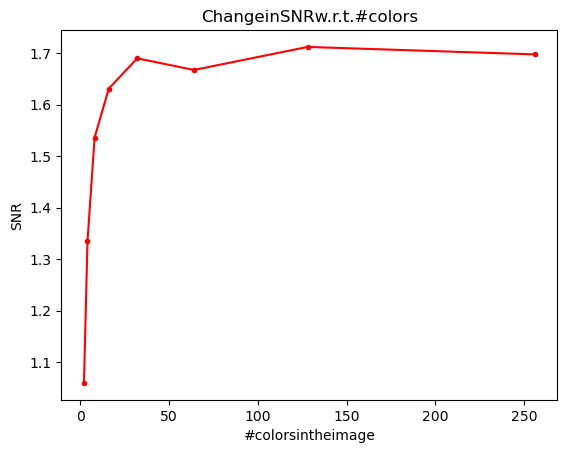

In [30]:
pylab.plot(num_colors_list,snr_list,'r.-')
pylab.xlabel('#colorsintheimage')
pylab.ylabel('SNR')
pylab.title('ChangeinSNRw.r.t.#colors')
pylab.xscale('log',basex=2)
pylab.gca().invert_xaxis()
pylab.show()

SNR for the original Image =1.764227349955047
SNR for the original Image =1.7642273499550474


Text(0.5, 1.0, 'reconstructed image')

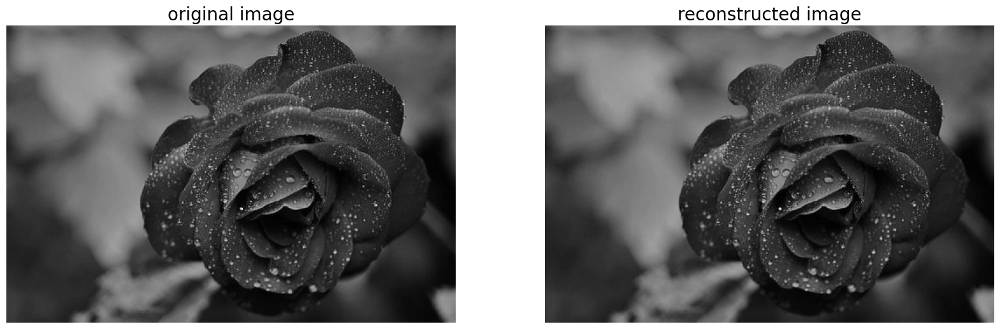

In [32]:
#b)Fast Fourier Transform to compute DFT
# FFT Operations
im=np.array(Image.open('Pictures/rose.jpg').convert('L'))
snr=signaltonoise(im, axis=None)
print("SNR for the original Image =" +str(snr))
freq=fp.fft2(im)
im1=fp.ifft2(freq).real
snr=signaltonoise(im1,axis=None)
print('SNR for the original Image =' +str(snr))
assert(np.allclose(im,im1))
pylab.figure(figsize=(20,10))
pylab.subplot(121), pylab.imshow(im, cmap='gray'),pylab.axis('off')
pylab.title('original image' ,size=20)
pylab.subplot(122), pylab.imshow(im, cmap='gray'),pylab.axis('off')
pylab.title('reconstructed image' ,size=20)

C:\Users\Dnyaneshwar10\AppData\Local\Temp\ipykernel_8128\1899037349.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.imshow(20*np.log10(0.1+freq2).astype(int)),


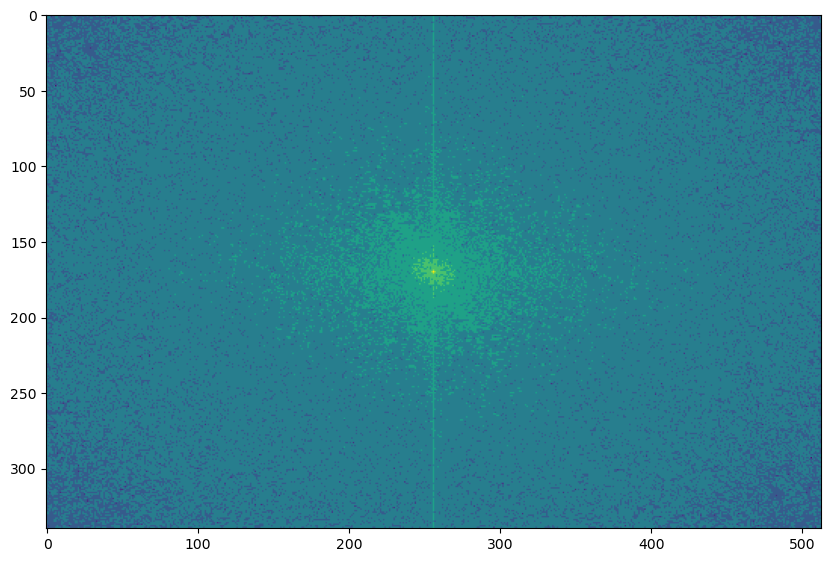

In [33]:
freq2=fp.fftshift(freq)
pylab.figure(figsize=(10,10)),
pylab.imshow(20*np.log10(0.1+freq2).astype(int)),
pylab.show()

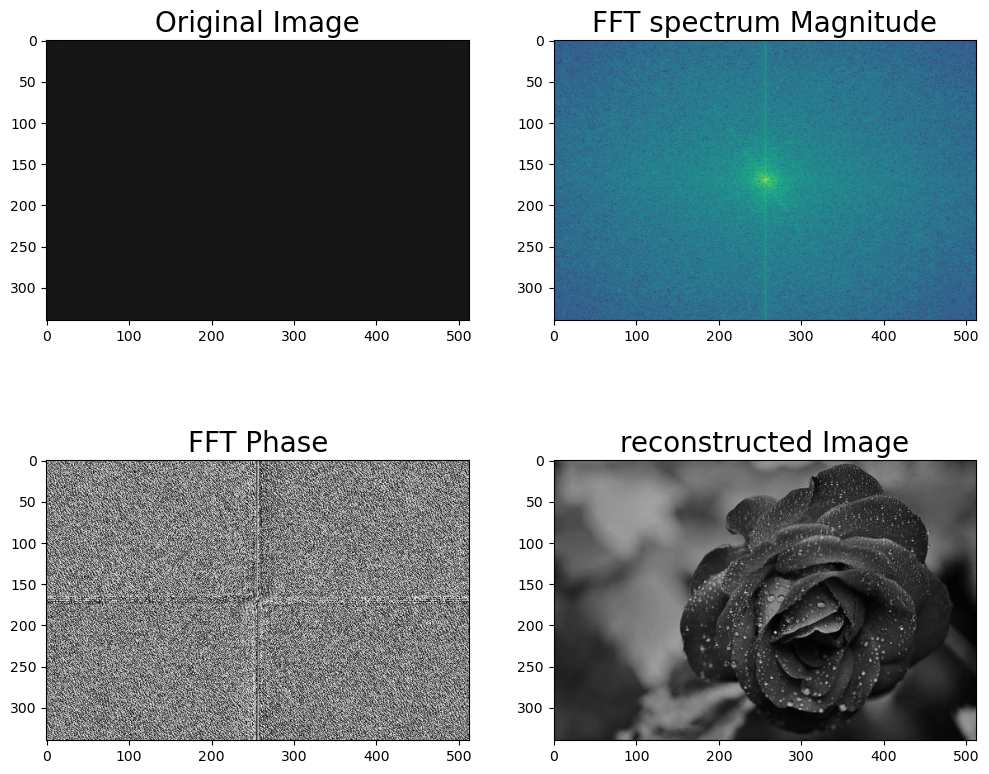

(Text(0.5, 1.0, 'reconstructed Image'), None)

In [36]:
#FFT with numpy
import numpy.fft as fp
im1=rgb2gray(imread('Pictures/rose.jpg'))
pylab.figure(figsize=(12,10))
freq1=fp.fft2(im1)
im1=fp.ifft2(im1).real
pylab.subplot(2,2,1), pylab.imshow(im1, cmap='gray')
pylab.title('Original Image', size=20)
pylab.subplot(2,2,2), pylab.imshow(20*np.log10(0.01 + np.abs(fp.fftshift(freq1))))
pylab.title('FFT spectrum Magnitude', size=20)
pylab.subplot(2,2,3), pylab.imshow(np.angle(fp.fftshift(freq1)), cmap='gray')
pylab.title('FFT Phase' , size=20)
pylab.subplot(2,2,4), pylab.imshow(np.clip(im,0,255), cmap='gray')
pylab.title('reconstructed Image', size=20), pylab.show()